# Task 3: Variational Autoencoder (VAE)

This notebook implements and compares convolutional VAEs on MNIST to learn latent representations, reconstruct inputs, generate new samples, and study the effect of latent dimensionality.

## Objectives
- Building a convolutional VAE and training a model with latent dimension 128
- Training and evaluating on the MNIST dataset
- Visualizing reconstructions, generated samples, and latent-space evolution (2D/3D PCA)
- Performing latent-space interpolations between samples
- Training another VAE model with latent dimension 256
- Comparing models by showing reconstructions and generated images side by side

## 1. Importing Libraries and Setuping up device

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import os
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D  # required for 3D plotting

# Set random seeds for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Device configuration
device = torch.device('cuda:2' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

Using device: cuda:2


## 2. Data Loading and Preprocessing

Training samples: 60000
Validation samples: 10000
Image shape: torch.Size([1, 28, 28])


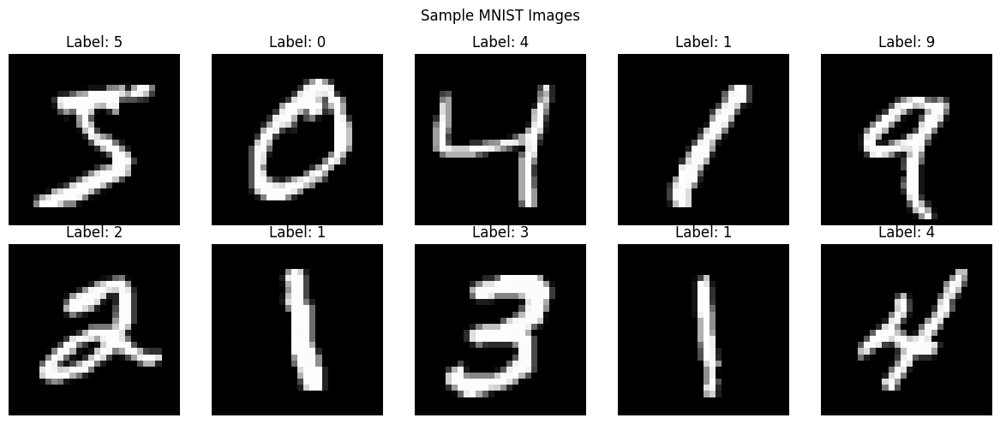

In [2]:
# Define transformations for MNIST dataset
transform = transforms.Compose([
    transforms.ToTensor(),  # Convert images to tensors (values in [0, 1])
])

# Load MNIST dataset
train_dataset = datasets.MNIST(root='./data', train=True, transform=transform, download=True)
val_dataset = datasets.MNIST(root='./data', train=False, transform=transform, download=True)

# Create data loaders
batch_size = 128
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=0)

print(f"Training samples: {len(train_dataset)}")
print(f"Validation samples: {len(val_dataset)}")
print(f"Image shape: {train_dataset[0][0].shape}")

# Visualize some samples
fig, axes = plt.subplots(2, 5, figsize=(12, 5))
for i, ax in enumerate(axes.flat):
    img, label = train_dataset[i]
    ax.imshow(img.squeeze(), cmap='gray')
    ax.set_title(f'Label: {label}')
    ax.axis('off')
plt.suptitle('Sample MNIST Images')
plt.tight_layout()
plt.show()

##  Variational Autoencoders (VAE)

A VAE is a probabilistic generative model that learns a latent distribution enabling both reconstruction and sampling.

![VAE Architecture](assets/Variational_Autoencoder.png)

Source: https://en.wikipedia.org/wiki/Variational_autoencoder
### Key components
- Encoder: maps input x to latent parameters μ(x), logσ²(x)
- Reparameterization: z = μ + σ ⊙ ε with ε ~ N(0, I) (enables backprop through sampling)
- Decoder: p(x|z) reconstructs inputs from z
- Objective (ELBO): reconstruction term + KL regularizer
  - Reconstruction: BCE between x and x̂ encourages fidelity
  - KL divergence: D_KL[q(z|x) || N(0, I)] regularizes the latent space

This setup yields smooth latent spaces, enabling interpolation and sampling while maintaining meaningful structure.

#### Sources:
- Variational autoencoder (Wikipedia). https://en.wikipedia.org/wiki/Variational_autoencoder
- Lab 11 Reference Materials. https://github.com/ckingkan/AT82.08-computer-vision/blob/main/labs_instructor_copies/lab11.2_VAE.ipynb


### Implementing VAE model

Building a convolutional VAE with an encoder producing μ and logσ², reparameterization for sampling, and a transpose-conv decoder.

In [3]:
class VAE(nn.Module):
    def __init__(self, latent_dim=128):
        super(VAE, self).__init__()
        self.latent_dim = latent_dim
        
        # Encoder: 4 convolutional layers
        # Input: 1 x 28 x 28
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=3, stride=2, padding=1),  # 32 x 14 x 14
            nn.BatchNorm2d(32),
            nn.ReLU(),
            
            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),  # 64 x 7 x 7
            nn.BatchNorm2d(64),
            nn.ReLU(),
            
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),  # 128 x 4 x 4
            nn.BatchNorm2d(128),
            nn.ReLU(),
            
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),  # 256 x 2 x 2
            nn.BatchNorm2d(256),
            nn.ReLU(),
        )
        
        # Flattened size after encoder: 256 * 2 * 2 = 1024
        self.flatten_size = 256 * 2 * 2
        
        # Linear layers to produce mean (mu) and log variance (logvar)
        self.fc_mu = nn.Linear(self.flatten_size, latent_dim)
        self.fc_logvar = nn.Linear(self.flatten_size, latent_dim)
        
        # Decoder: Linear layer followed by transpose convolutions
        self.fc_decode = nn.Linear(latent_dim, self.flatten_size)
        
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),  # 128 x 4 x 4
            nn.BatchNorm2d(128),
            nn.ReLU(),
            
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=0),  # 64 x 7 x 7
            nn.BatchNorm2d(64),
            nn.ReLU(),
            
            nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),  # 32 x 14 x 14
            nn.BatchNorm2d(32),
            nn.ReLU(),
            
            nn.ConvTranspose2d(32, 1, kernel_size=3, stride=2, padding=1, output_padding=1),  # 1 x 28 x 28
            nn.Sigmoid()  # Output values in [0, 1]
        )
    
    def encode(self, x):
        """Encode input to latent space parameters (mu and logvar)"""
        x = self.encoder(x)
        x = x.view(x.size(0), -1)  # Flatten
        mu = self.fc_mu(x)
        logvar = self.fc_logvar(x)
        return mu, logvar
    
    def reparameterize(self, mu, logvar):
        """Reparameterization trick: z = mu + sigma * epsilon"""
        std = torch.exp(0.5 * logvar)  # Standard deviation
        eps = torch.randn_like(std)  # Sample epsilon from N(0, 1)
        z = mu + eps * std
        return z
    
    def decode(self, z):
        """Decode latent vector to reconstructed image"""
        x = self.fc_decode(z)
        x = x.view(x.size(0), 256, 2, 2)  # Reshape for transpose conv
        x = self.decoder(x)
        return x
    
    def forward(self, x):
        """Forward pass through VAE"""
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        recon_x = self.decode(z)
        return recon_x, mu, logvar

# Instantiate the model
vae_128 = VAE(latent_dim=128).to(device)
print(vae_128)
print(f"\nTotal parameters: {sum(p.numel() for p in vae_128.parameters()):,}")

VAE(
  (encoder): Sequential(
    (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU()
    (9): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (10): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU()
  )
  (fc_mu): Linear(in_features=1024, out_features=128, bias=True)
  (fc_logvar): Linear(in_features=1024, out_features=128, bias=True)
  (fc_decode): Linear(in_features=128, out_features=1024, bias=True)
  (decoder): Sequential(
    (0): Con

## Loss Function and Training Loop

The VAE loss consists of two components:
1. **Reconstruction Loss**: Binary Cross-Entropy (BCE) - measures how well the decoder reconstructs the input
2. **KL Divergence**: Measures how close the learned latent distribution is to a standard normal distribution N(0, 1)

In [4]:
def vae_loss(recon_x, x, mu, logvar):
    """
    VAE loss = Reconstruction loss + KL divergence
    
    Args:
        recon_x: Reconstructed image
        x: Original image
        mu: Mean of latent distribution
        logvar: Log variance of latent distribution
    """
    # Binary Cross-Entropy loss for reconstruction
    BCE = F.binary_cross_entropy(recon_x, x, reduction='sum')
    
    # KL divergence: -0.5 * sum(1 + log(sigma^2) - mu^2 - sigma^2)
    # This measures how different the learned distribution is from N(0, 1)
    KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    
    return BCE + KLD, BCE, KLD

def train_epoch(model, dataloader, optimizer, device):
    """Train for one epoch"""
    model.train()
    train_loss = 0
    train_bce = 0
    train_kld = 0
    
    for batch_idx, (data, _) in enumerate(dataloader):
        data = data.to(device)
        optimizer.zero_grad()
        
        # Forward pass
        recon_batch, mu, logvar = model(data)
        
        # Calculate loss
        loss, bce, kld = vae_loss(recon_batch, data, mu, logvar)
        
        # Backward pass
        loss.backward()
        optimizer.step()
        
        train_loss += loss.item()
        train_bce += bce.item()
        train_kld += kld.item()
    
    # Average losses
    avg_loss = train_loss / len(dataloader.dataset)
    avg_bce = train_bce / len(dataloader.dataset)
    avg_kld = train_kld / len(dataloader.dataset)
    
    return avg_loss, avg_bce, avg_kld

def validate_epoch(model, dataloader, device):
    """Validate for one epoch"""
    model.eval()
    val_loss = 0
    val_bce = 0
    val_kld = 0
    
    with torch.no_grad():
        for data, _ in dataloader:
            data = data.to(device)
            recon_batch, mu, logvar = model(data)
            loss, bce, kld = vae_loss(recon_batch, data, mu, logvar)
            
            val_loss += loss.item()
            val_bce += bce.item()
            val_kld += kld.item()
    
    # Average losses
    avg_loss = val_loss / len(dataloader.dataset)
    avg_bce = val_bce / len(dataloader.dataset)
    avg_kld = val_kld / len(dataloader.dataset)
    
    return avg_loss, avg_bce, avg_kld

print("Loss functions and training functions defined successfully!")

Loss functions and training functions defined successfully!


### Training VAE with Latent Dimension = 128

In [5]:
# Training configuration
num_epochs = 50
learning_rate = 1e-3

# Optimizer
optimizer_128 = optim.Adam(vae_128.parameters(), lr=learning_rate)

# Lists to store losses
train_losses_128 = []
val_losses_128 = []
train_bce_losses_128 = []
train_kld_losses_128 = []

# Dictionary to store latent vectors over epochs
latent_history = {}  # key: epoch, value: (latent_vectors, labels)

# Training loop
print("Training VAE with latent dimension = 128...")
for epoch in range(1, num_epochs + 1):
    # Train
    train_loss, train_bce, train_kld = train_epoch(vae_128, train_loader, optimizer_128, device)
    
    # Validate
    val_loss, val_bce, val_kld = validate_epoch(vae_128, val_loader, device)
    
    # Store losses
    train_losses_128.append(train_loss)
    val_losses_128.append(val_loss)
    train_bce_losses_128.append(train_bce)
    train_kld_losses_128.append(train_kld)
    
    # Encode validation set to latent space at first epoch and every 5 epochs
    if epoch == 1 or epoch % 5 == 0:
        vae_128.eval()
        latent_vectors = []
        labels_list = []
        with torch.no_grad():
            for images, labels in val_loader:
                images = images.to(device)
                mu, _ = vae_128.encode(images)  # only take mean as latent vector
                latent_vectors.append(mu.cpu().numpy())
                labels_list.append(labels.numpy())
        latent_vectors = np.concatenate(latent_vectors, axis=0)
        labels_list = np.concatenate(labels_list, axis=0)
        latent_history[epoch] = (latent_vectors, labels_list)
        vae_128.train()
    
    # Print progress
    if epoch % 5 == 0 or epoch == 1:
        print(f'Epoch {epoch:2d}/{num_epochs} | Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | '
              f'BCE: {train_bce:.4f} | KLD: {train_kld:.4f} | Latent stored')

print("\nTraining completed!")

# Save the model
torch.save(vae_128.state_dict(), 'vae_128.pth')
print("Model saved as 'vae_128.pth'")

Training VAE with latent dimension = 128...
Epoch  1/50 | Train Loss: 179.3298 | Val Loss: 123.0975 | BCE: 162.0783 | KLD: 17.2515 | Latent stored
Epoch  5/50 | Train Loss: 103.4502 | Val Loss: 102.1197 | BCE: 79.3495 | KLD: 24.1007 | Latent stored
Epoch 10/50 | Train Loss: 99.8033 | Val Loss: 99.4887 | BCE: 75.8655 | KLD: 23.9378 | Latent stored
Epoch 15/50 | Train Loss: 98.1266 | Val Loss: 97.7140 | BCE: 74.3593 | KLD: 23.7673 | Latent stored
Epoch 20/50 | Train Loss: 97.0591 | Val Loss: 96.9529 | BCE: 73.3780 | KLD: 23.6811 | Latent stored
Epoch 25/50 | Train Loss: 96.2872 | Val Loss: 96.5072 | BCE: 72.6882 | KLD: 23.5990 | Latent stored
Epoch 30/50 | Train Loss: 95.7269 | Val Loss: 95.5780 | BCE: 72.1866 | KLD: 23.5404 | Latent stored
Epoch 35/50 | Train Loss: 95.2738 | Val Loss: 95.4931 | BCE: 71.7868 | KLD: 23.4869 | Latent stored
Epoch 40/50 | Train Loss: 94.8720 | Val Loss: 94.8981 | BCE: 71.4356 | KLD: 23.4365 | Latent stored
Epoch 45/50 | Train Loss: 94.5612 | Val Loss: 94.73

### Visualizing Training Progress

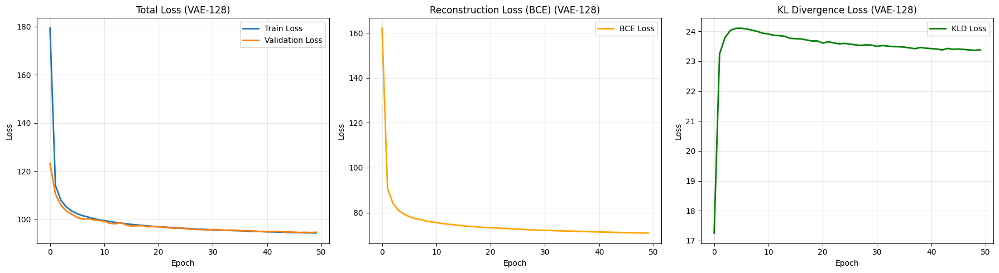

In [6]:
# Plot training and val losses
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Total loss
axes[0].plot(train_losses_128, label='Train Loss', linewidth=2)
axes[0].plot(val_losses_128, label='Validation Loss', linewidth=2)
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].set_title('Total Loss (VAE-128)')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# BCE loss
axes[1].plot(train_bce_losses_128, label='BCE Loss', color='orange', linewidth=2)
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Loss')
axes[1].set_title('Reconstruction Loss (BCE) (VAE-128)')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

# KLD loss
axes[2].plot(train_kld_losses_128, label='KLD Loss', color='green', linewidth=2)
axes[2].set_xlabel('Epoch')
axes[2].set_ylabel('Loss')
axes[2].set_title('KL Divergence Loss (VAE-128)')
axes[2].legend()
axes[2].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

## Visualization of Reconstruction and Latent Space Evolution

### Reconstruction Visualization

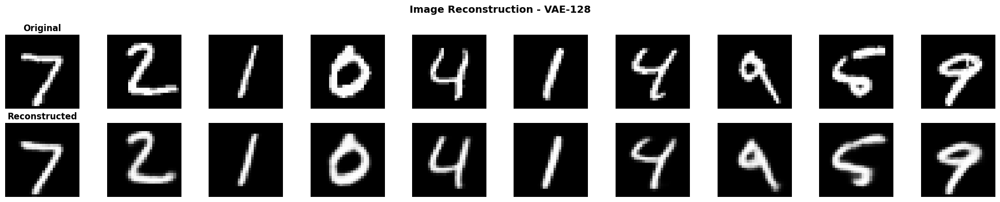

In [7]:
# Visualize reconstructions
vae_128.eval()

# Get a batch of validation images
val_images, val_labels = next(iter(val_loader))
val_images = val_images.to(device)

# Reconstruct images
with torch.no_grad():
    recon_images, mu, logvar = vae_128(val_images)

# Move to CPU for visualization
val_images = val_images.cpu()
recon_images = recon_images.cpu()

# Plot original and reconstructed images
n_images = 10
fig, axes = plt.subplots(2, n_images, figsize=(20, 4))

for i in range(n_images):
    # Original images
    axes[0, i].imshow(val_images[i].squeeze(), cmap='gray')
    axes[0, i].axis('off')
    if i == 0:
        axes[0, i].set_title('Original', fontsize=12, fontweight='bold')
    
    # Reconstructed images
    axes[1, i].imshow(recon_images[i].squeeze(), cmap='gray')
    axes[1, i].axis('off')
    if i == 0:
        axes[1, i].set_title('Reconstructed', fontsize=12, fontweight='bold')

plt.suptitle('Image Reconstruction - VAE-128', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

### Latent Space Evolution Visualization (2D Projection using PCA)

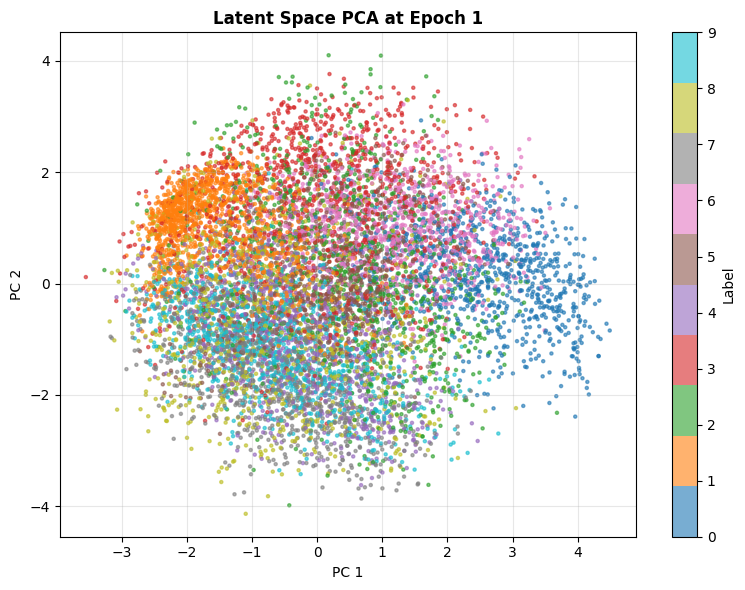

Epoch 1 - Explained variance: 0.1762


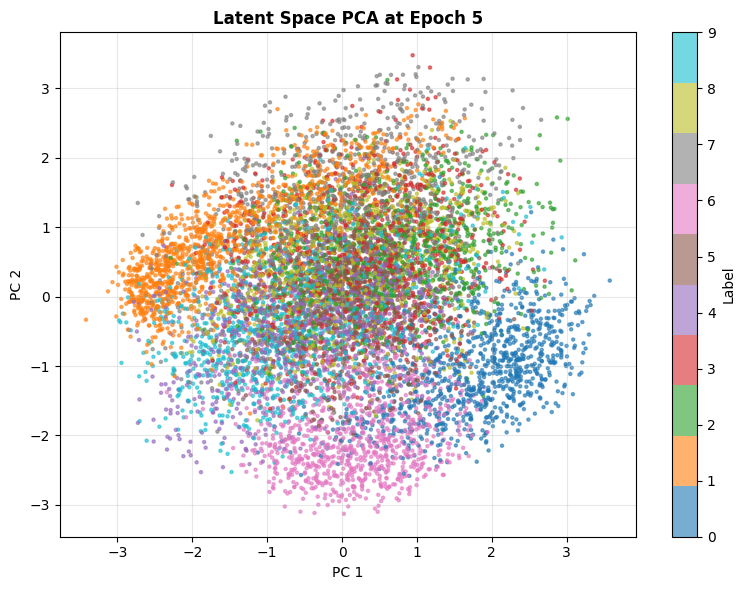

Epoch 5 - Explained variance: 0.1622


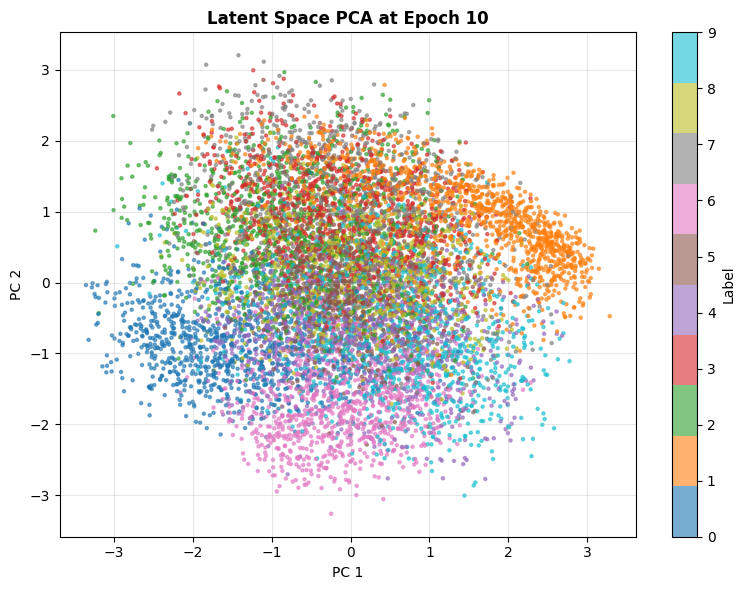

Epoch 10 - Explained variance: 0.1593


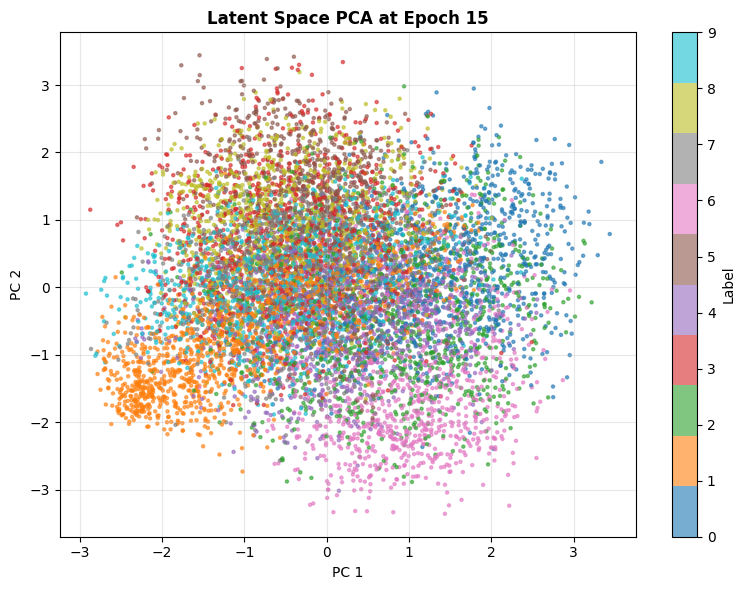

Epoch 15 - Explained variance: 0.1651


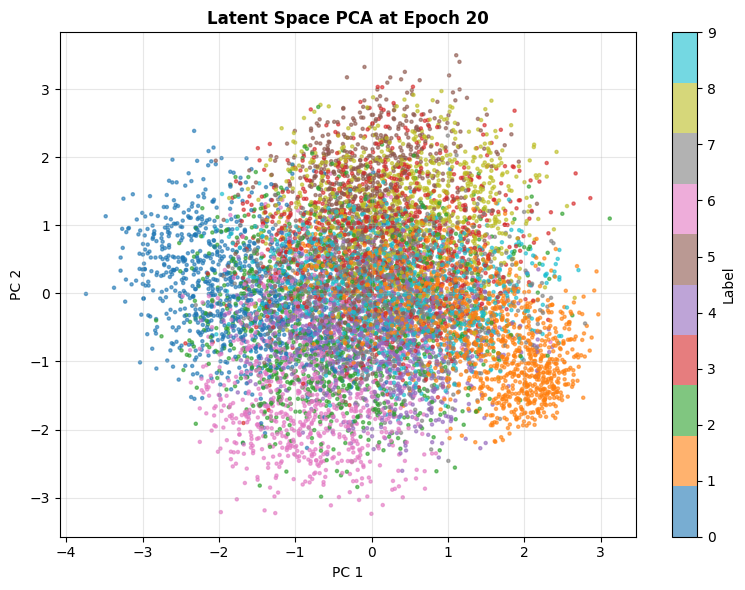

Epoch 20 - Explained variance: 0.1593


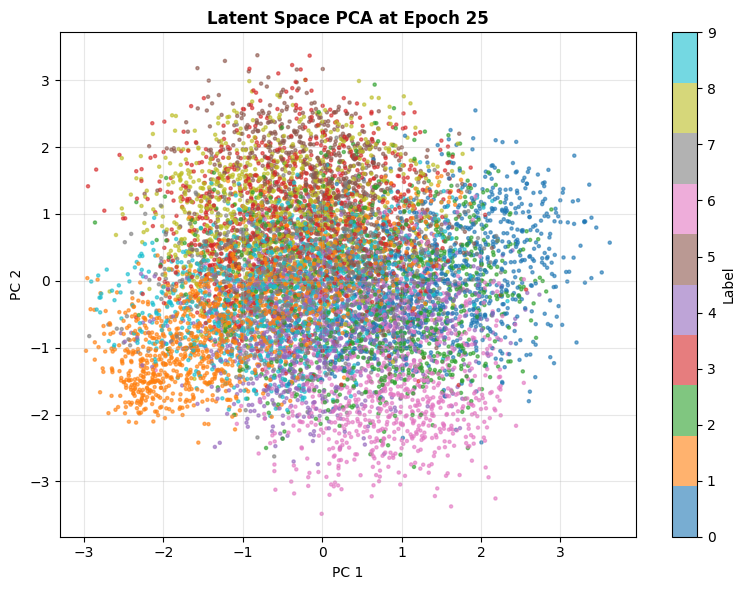

Epoch 25 - Explained variance: 0.1673


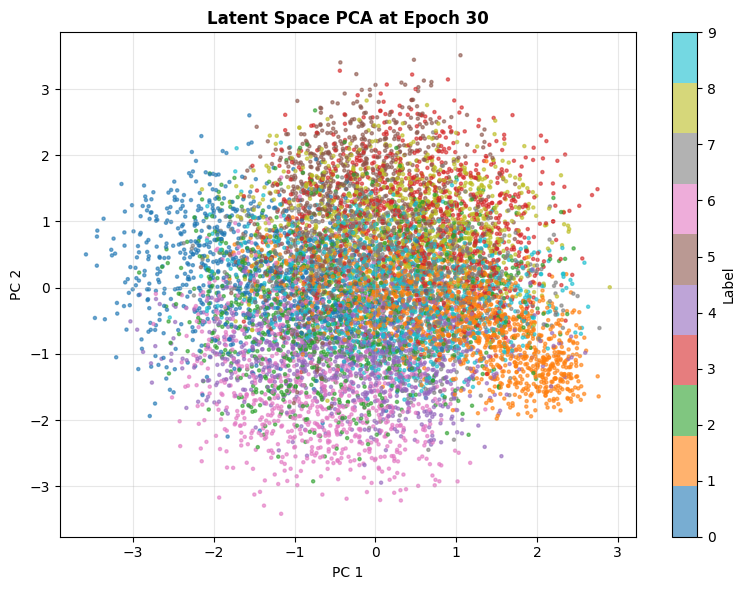

Epoch 30 - Explained variance: 0.1666


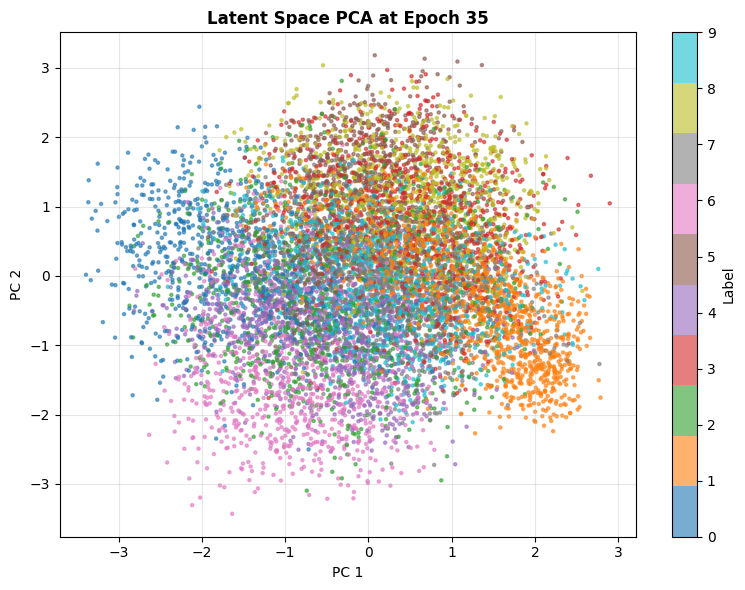

Epoch 35 - Explained variance: 0.1674


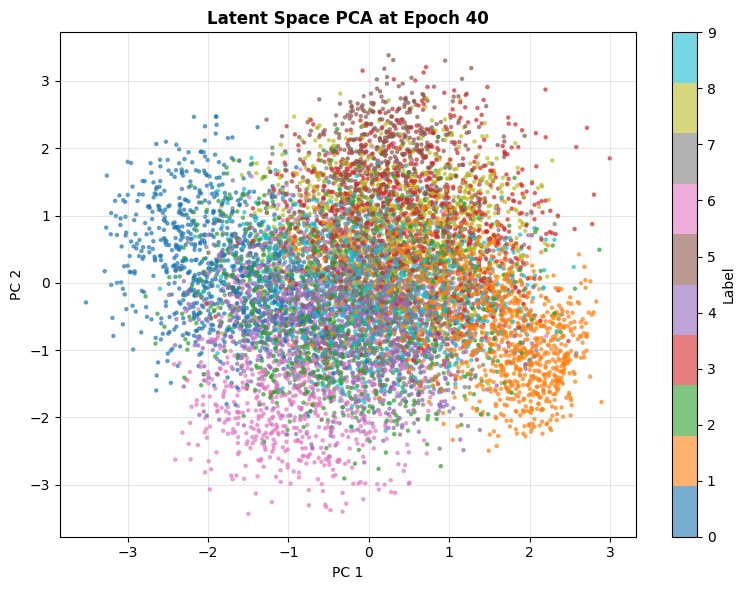

Epoch 40 - Explained variance: 0.1664


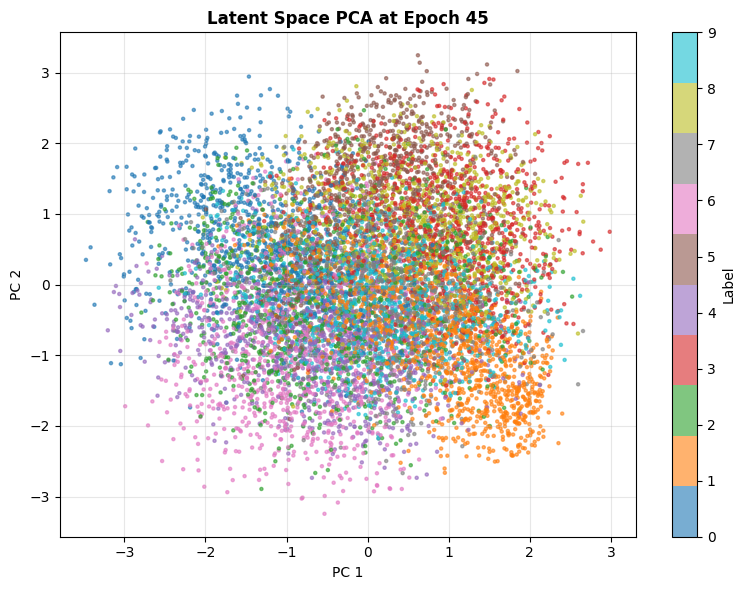

Epoch 45 - Explained variance: 0.1670


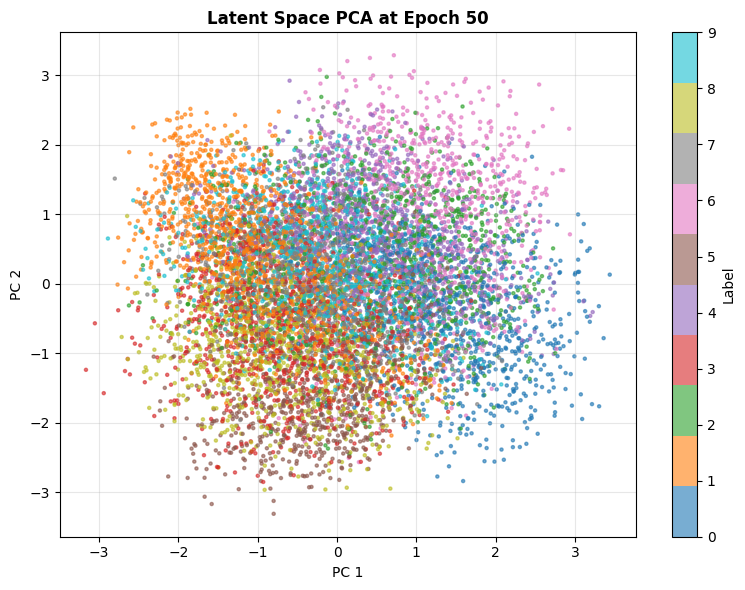

Epoch 50 - Explained variance: 0.1690


In [ ]:
for epoch, (latent_vectors, labels_list) in latent_history.items():
    pca = PCA(n_components=2)
    latent_2d = pca.fit_transform(latent_vectors)
    
    plt.figure(figsize=(8, 6))
    scatter = plt.scatter(latent_2d[:, 0], latent_2d[:, 1], c=labels_list, cmap='tab10', s=5, alpha=0.6)
    plt.colorbar(scatter, label='Label')
    plt.xlabel('PC 1')
    plt.ylabel('PC 2')
    plt.title(f'Latent Space PCA at Epoch {epoch}', fontsize=12, fontweight='bold')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    print(f"Epoch {epoch} - Explained variance: {pca.explained_variance_ratio_.sum():.4f}")


### Latent Space Evolution Visualization (3D Projection using PCA)

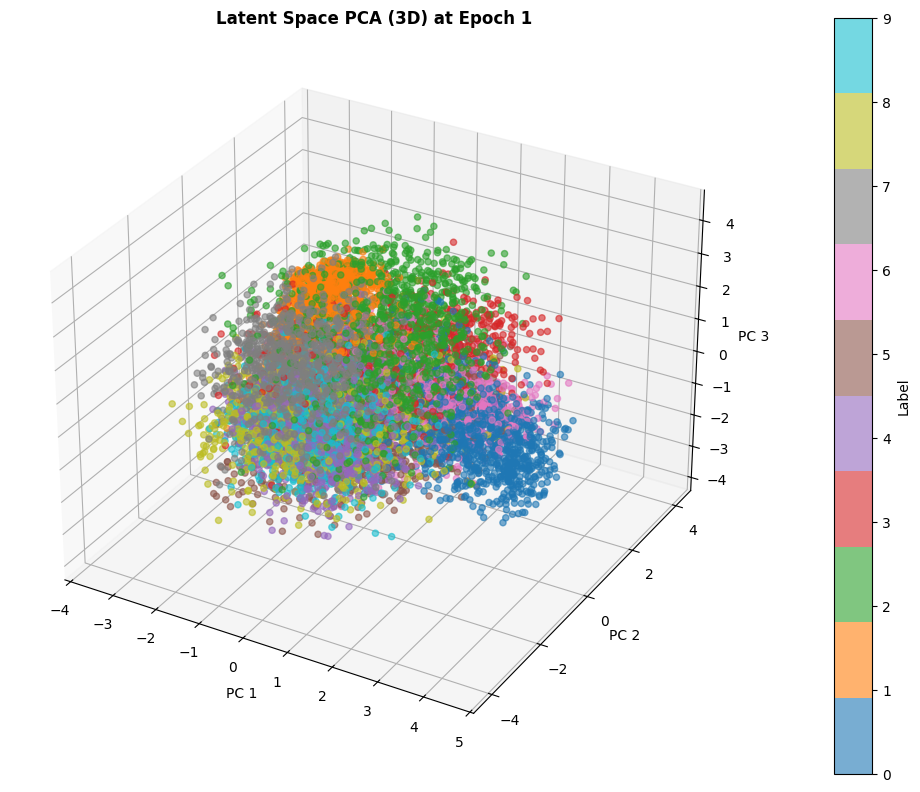

Epoch 1 - Explained variance: 0.2554


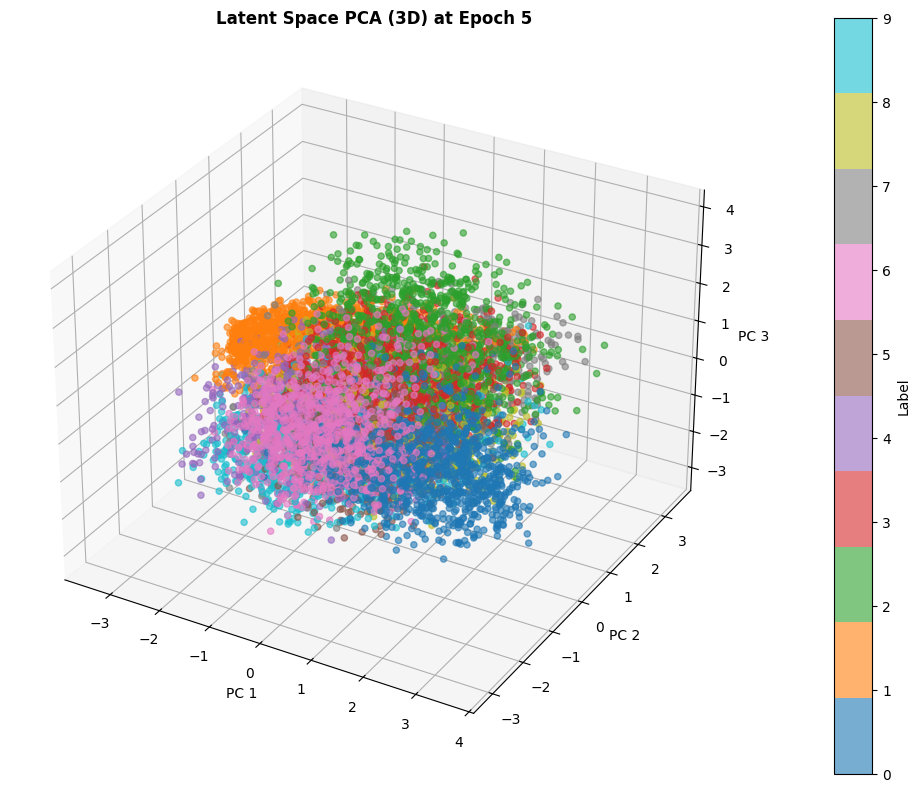

Epoch 5 - Explained variance: 0.2339


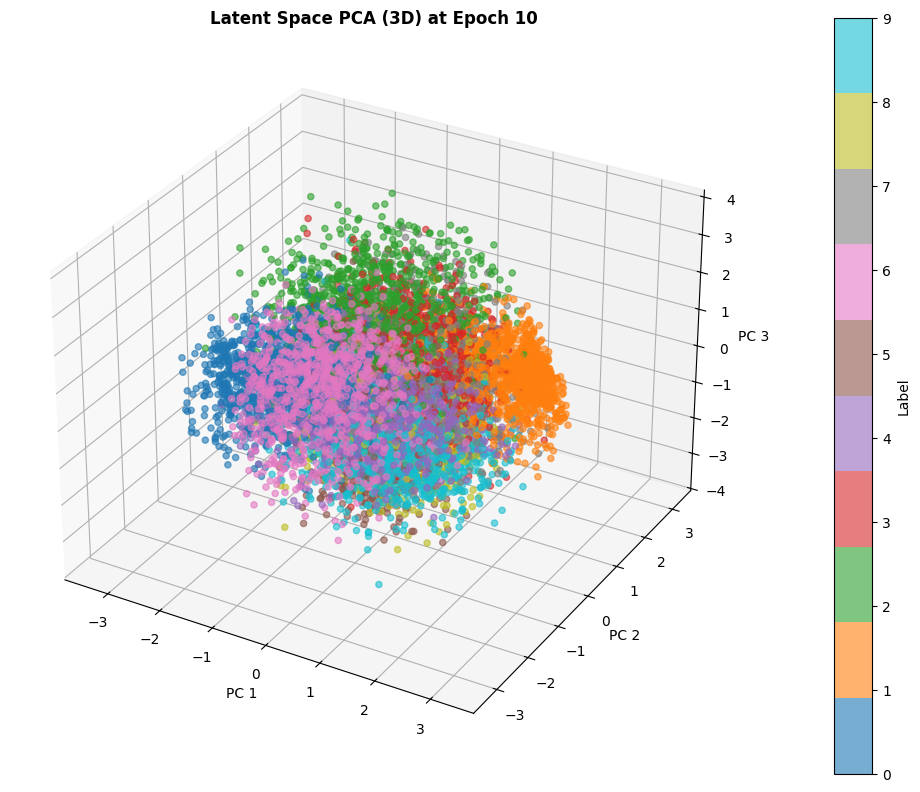

Epoch 10 - Explained variance: 0.2348


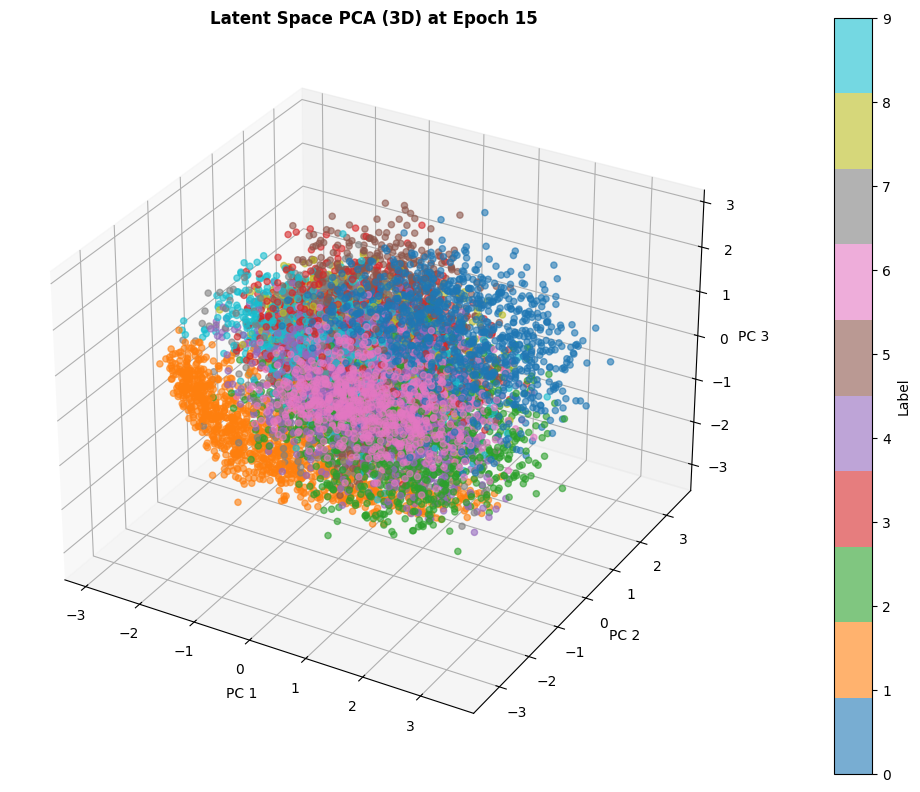

Epoch 15 - Explained variance: 0.2398


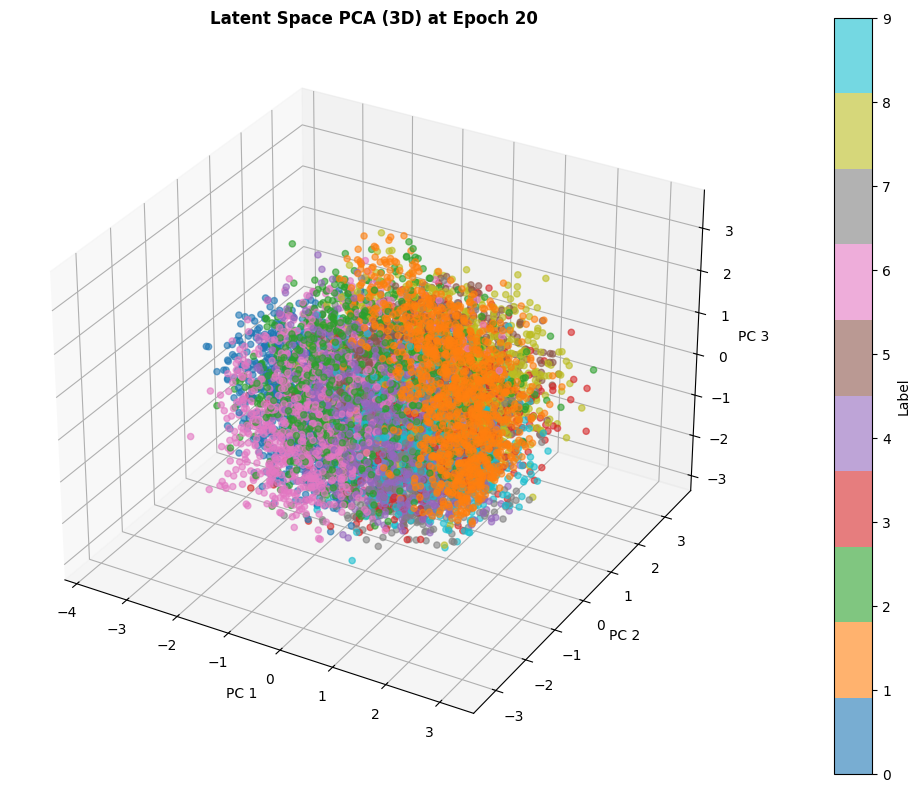

Epoch 20 - Explained variance: 0.2351


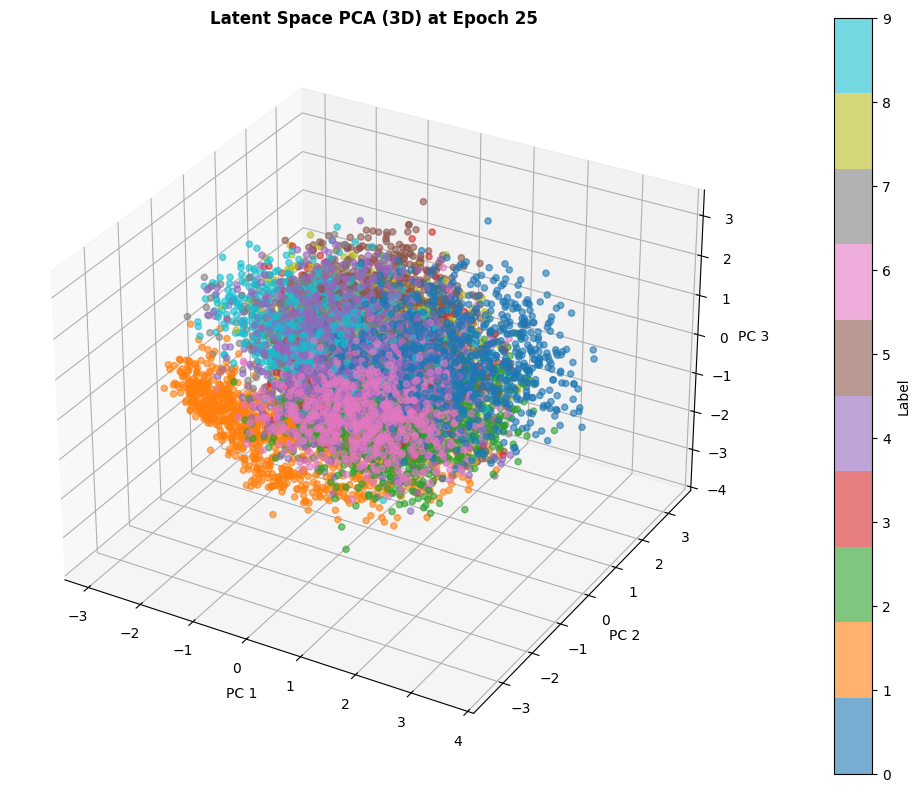

Epoch 25 - Explained variance: 0.2411


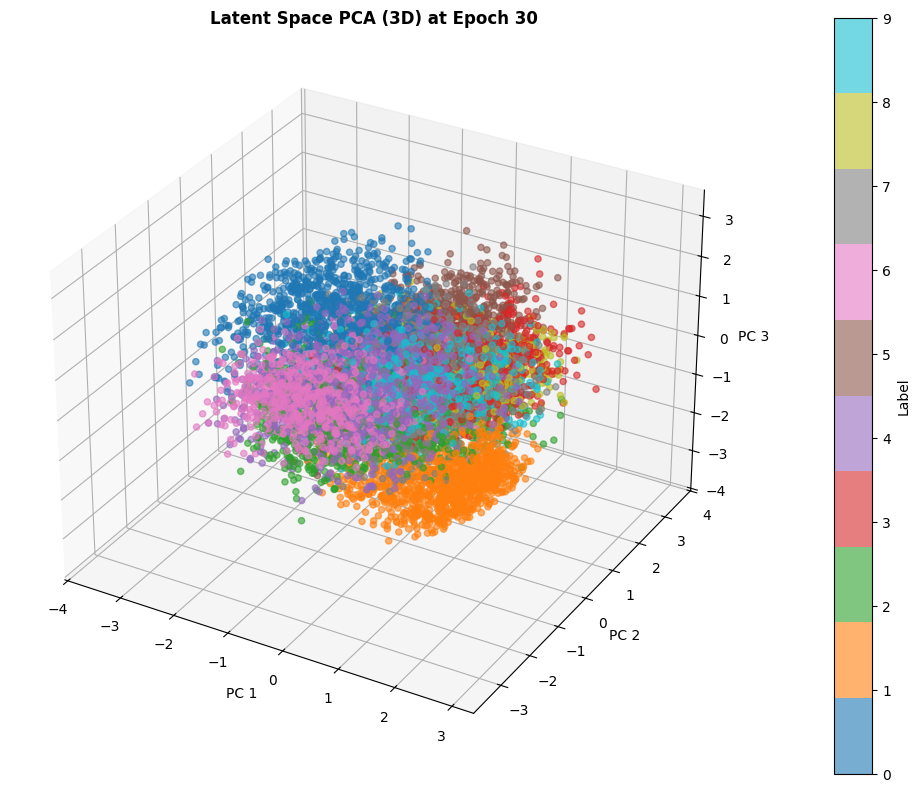

Epoch 30 - Explained variance: 0.2424


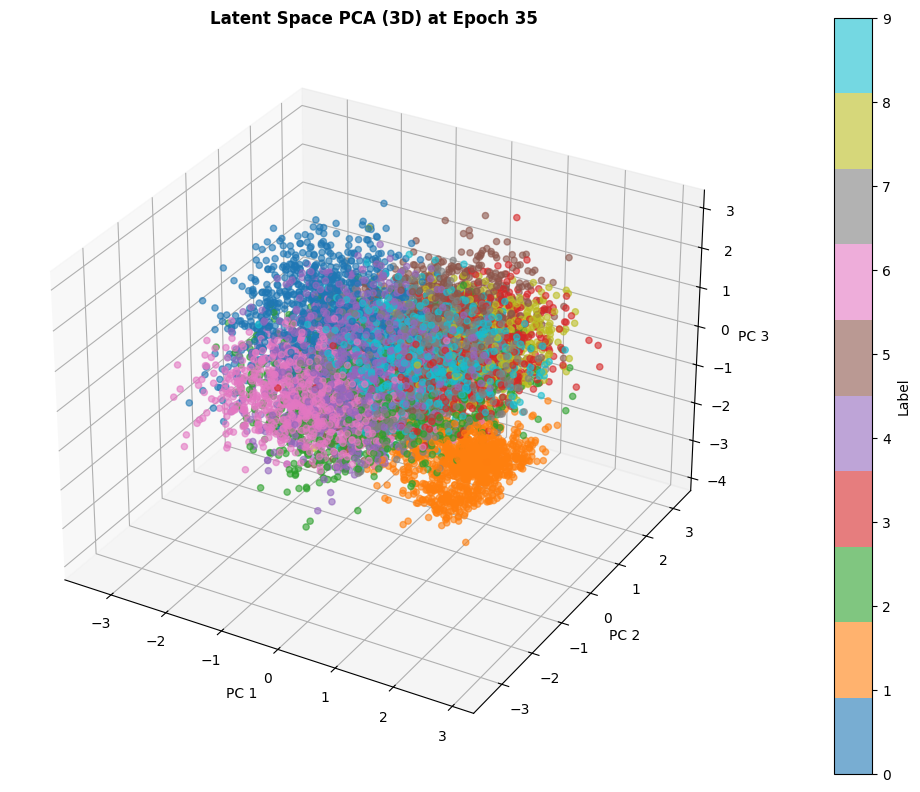

Epoch 35 - Explained variance: 0.2421


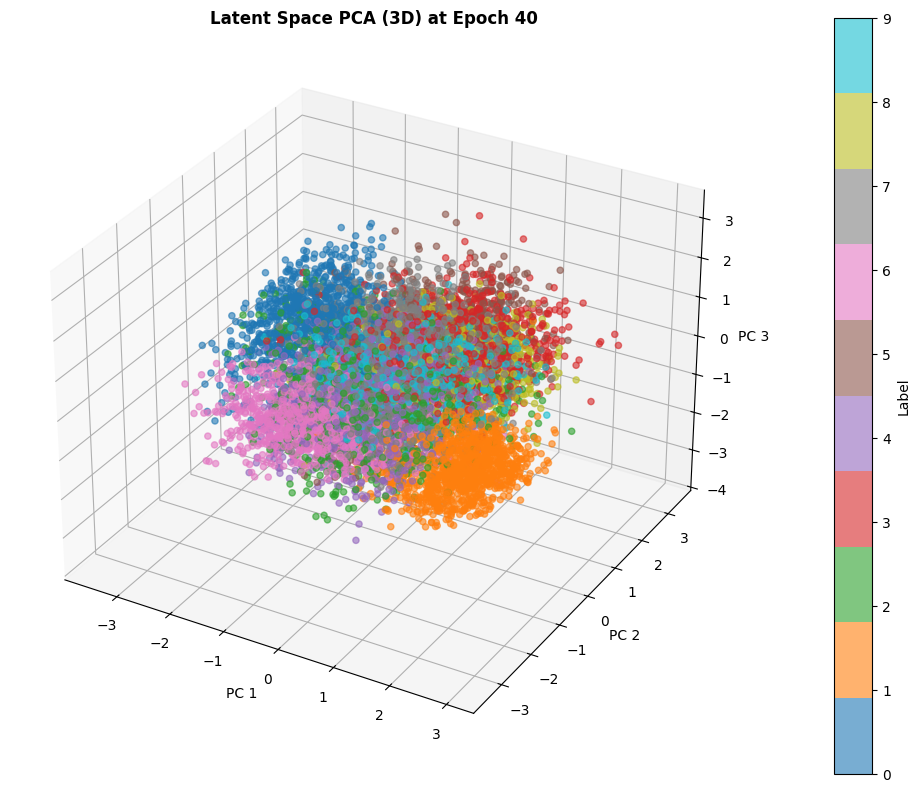

Epoch 40 - Explained variance: 0.2425


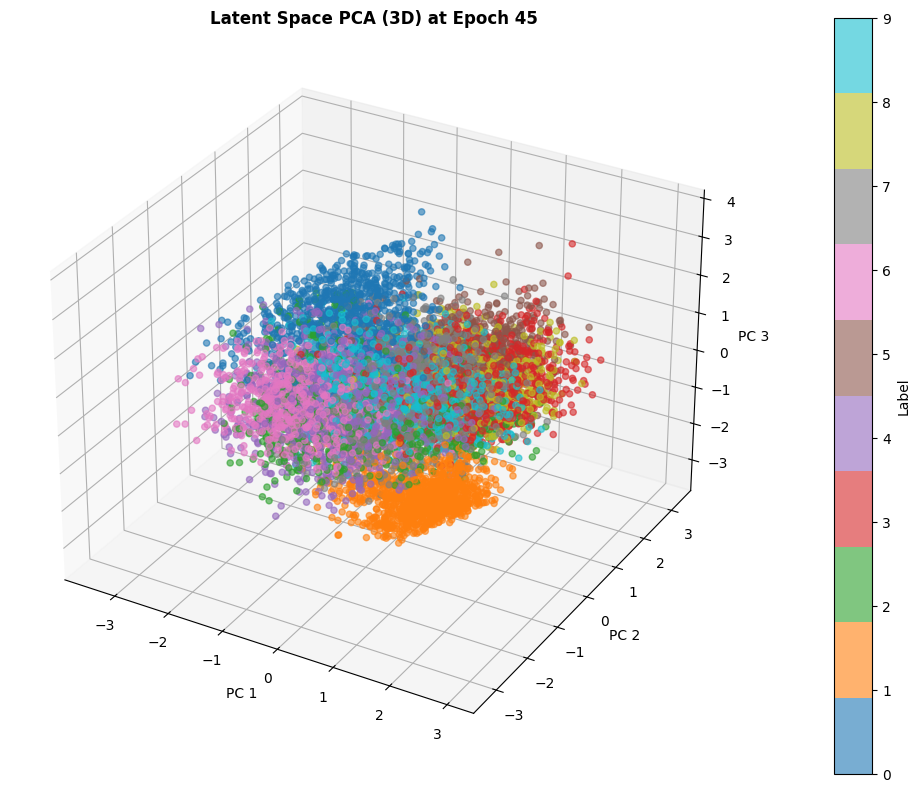

Epoch 45 - Explained variance: 0.2438


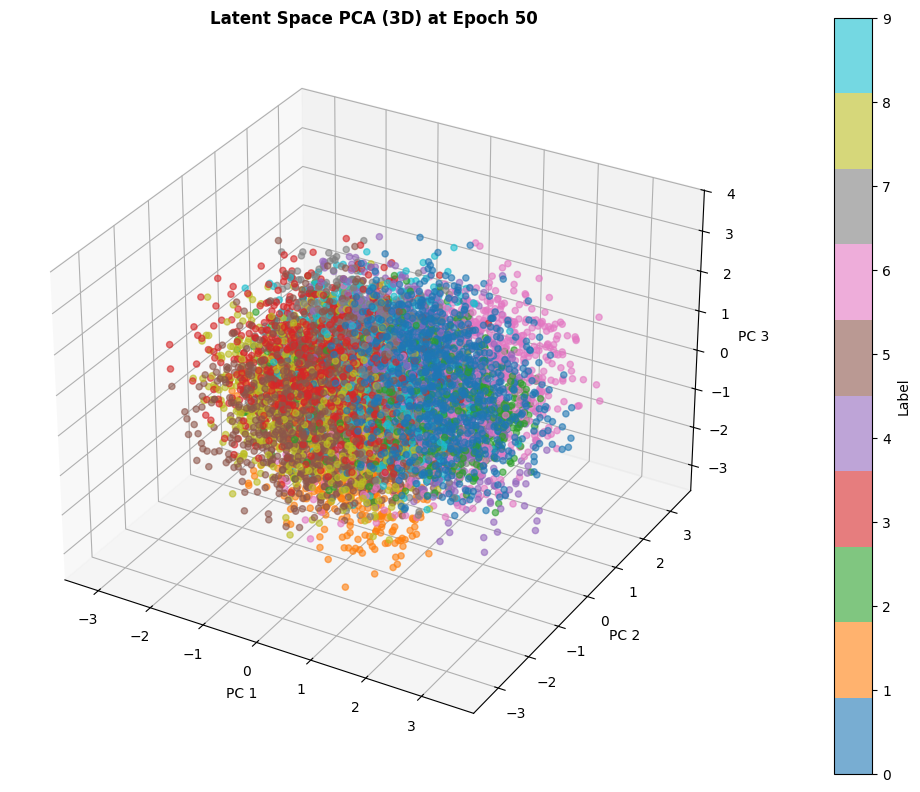

Epoch 50 - Explained variance: 0.2428


In [ ]:
for epoch, (latent_vectors, labels_list) in latent_history.items():
    # Reduce to 3D
    pca = PCA(n_components=3)
    latent_3d = pca.fit_transform(latent_vectors)
    
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    scatter = ax.scatter(
        latent_3d[:, 0], latent_3d[:, 1], latent_3d[:, 2],
        c=labels_list, cmap='tab10', s=20, alpha=0.6
    )
    
    cbar = fig.colorbar(scatter, ax=ax, pad=0.1)
    cbar.set_label('Label')
    
    ax.set_xlabel('PC 1')
    ax.set_ylabel('PC 2')
    ax.set_zlabel('PC 3')
    ax.set_title(f'Latent Space PCA (3D) at Epoch {epoch}', fontsize=12, fontweight='bold')
    
    plt.tight_layout()
    plt.show()
    
    print(f"Epoch {epoch} - Explained variance: {pca.explained_variance_ratio_.sum():.4f}")

## Image Generation and Interpolation

### Generating New Images from Random Latent Vectors

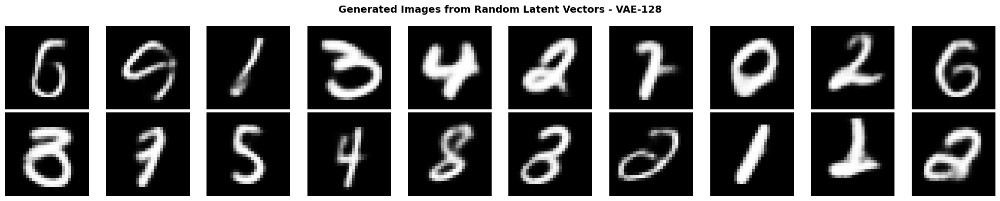

In [10]:
# Generate new images by sampling from N(0, 1)
vae_128.eval()

n_samples = 20
with torch.no_grad():
    # Sample random latent vectors from standard normal distribution
    z = torch.randn(n_samples, vae_128.latent_dim).to(device)
    
    # Decode to generate images
    generated_images = vae_128.decode(z).cpu()

# Plot generated images
fig, axes = plt.subplots(2, 10, figsize=(20, 4))
for i in range(n_samples):
    row = i // 10
    col = i % 10
    axes[row, col].imshow(generated_images[i].squeeze(), cmap='gray')
    axes[row, col].axis('off')

plt.suptitle('Generated Images from Random Latent Vectors - VAE-128', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

### Interpolation Between Two Latent Vectors

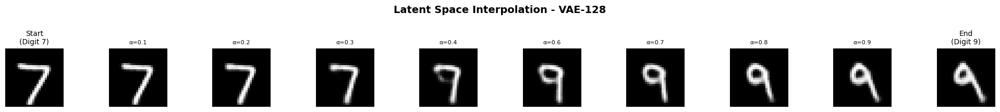

In [11]:
# Select two images from val set and interpolate between their latent representations
vae_128.eval()

# Get two different images (e.g., different digits)
idx1, idx2 = 0, 7  # You can change these indices
img1, label1 = val_dataset[idx1]
img2, label2 = val_dataset[idx2]

# Encode the two images
with torch.no_grad():
    img1_tensor = img1.unsqueeze(0).to(device)
    img2_tensor = img2.unsqueeze(0).to(device)
    
    mu1, _ = vae_128.encode(img1_tensor)
    mu2, _ = vae_128.encode(img2_tensor)
    
    # Interpolate between the two latent vectors
    n_steps = 10
    interpolated_images = []
    
    for alpha in np.linspace(0, 1, n_steps):
        # Linear interpolation: z = (1 - alpha) * z1 + alpha * z2
        z_interp = (1 - alpha) * mu1 + alpha * mu2
        
        # Decode interpolated latent vector
        img_interp = vae_128.decode(z_interp).cpu()
        interpolated_images.append(img_interp.squeeze())

# Plot the interpolation
fig, axes = plt.subplots(1, n_steps, figsize=(20, 2))
for i in range(n_steps):
    axes[i].imshow(interpolated_images[i], cmap='gray')
    axes[i].axis('off')
    if i == 0:
        axes[i].set_title(f'Start\n(Digit {label1})', fontsize=10)
    elif i == n_steps - 1:
        axes[i].set_title(f'End\n(Digit {label2})', fontsize=10)
    else:
        axes[i].set_title(f'α={i/(n_steps-1):.1f}', fontsize=8)

plt.suptitle('Latent Space Interpolation - VAE-128', fontsize=14, fontweight='bold', y=1.05)
plt.tight_layout()
plt.show()

### Multiple Interpolations

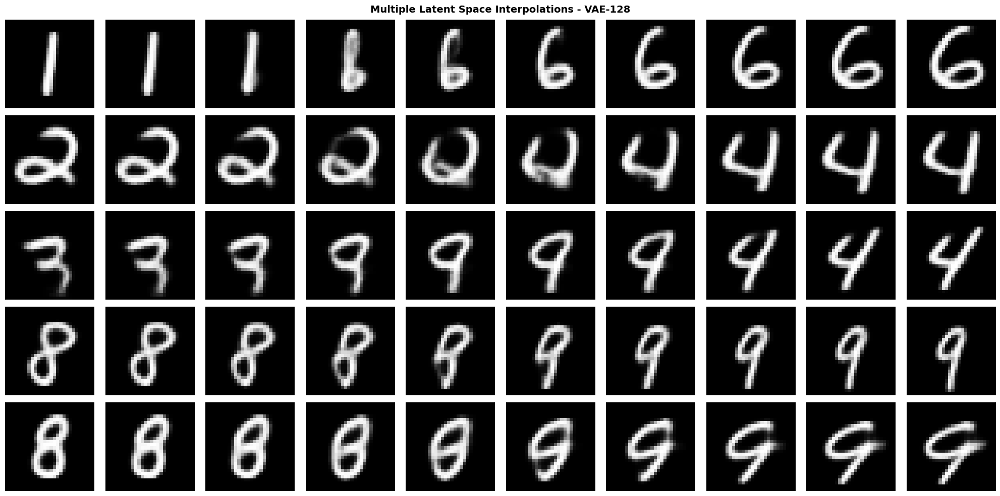

In [12]:
# Perform interpolation for multiple pairs
n_pairs = 5
n_steps = 10

fig, axes = plt.subplots(n_pairs, n_steps, figsize=(20, 10))

for pair_idx in range(n_pairs):
    # Select two random images
    idx1 = np.random.randint(0, len(val_dataset))
    idx2 = np.random.randint(0, len(val_dataset))
    
    img1, label1 = val_dataset[idx1]
    img2, label2 = val_dataset[idx2]
    
    with torch.no_grad():
        img1_tensor = img1.unsqueeze(0).to(device)
        img2_tensor = img2.unsqueeze(0).to(device)
        
        mu1, _ = vae_128.encode(img1_tensor)
        mu2, _ = vae_128.encode(img2_tensor)
        
        for step_idx, alpha in enumerate(np.linspace(0, 1, n_steps)):
            z_interp = (1 - alpha) * mu1 + alpha * mu2
            img_interp = vae_128.decode(z_interp).cpu().squeeze()
            
            axes[pair_idx, step_idx].imshow(img_interp, cmap='gray')
            axes[pair_idx, step_idx].axis('off')
            
            # Add labels for start and end
            if step_idx == 0:
                axes[pair_idx, step_idx].set_ylabel(f'{label1} → {label2}', fontsize=10, rotation=0, 
                                                     labelpad=30, va='center')

plt.suptitle('Multiple Latent Space Interpolations - VAE-128', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## VAE with Latent Dimension = 256

Now we will train a second VAE with latent dimension of 256 and compare their reconstruction and image generation.

In [13]:
# Create VAE with latent dimension = 256
vae_256 = VAE(latent_dim=256).to(device)
print(f"VAE-256 Total parameters: {sum(p.numel() for p in vae_256.parameters()):,}")

# Optimizer
optimizer_256 = optim.Adam(vae_256.parameters(), lr=learning_rate)

# Lists to store losses
train_losses_256 = []
val_losses_256 = []
train_bce_losses_256 = []
train_kld_losses_256 = []

# Dictionary to store latent vectors over epochs
latent_history_256 = {}  # key: epoch, value: (latent_vectors, labels)

# Training loop
print("\nTraining VAE with latent dimension = 256...")
for epoch in range(1, num_epochs + 1):
    # Train
    train_loss, train_bce, train_kld = train_epoch(vae_256, train_loader, optimizer_256, device)
    
    # Validate
    val_loss, val_bce, val_kld = validate_epoch(vae_256, val_loader, device)
    
    # Store losses
    train_losses_256.append(train_loss)
    val_losses_256.append(val_loss)
    train_bce_losses_256.append(train_bce)
    train_kld_losses_256.append(train_kld)
    
    # Encode validation set to latent space at first epoch and every 5 epochs
    if epoch == 1 or epoch % 5 == 0:
        vae_256.eval()
        latent_vectors = []
        labels_list = []
        with torch.no_grad():
            for images, labels in val_loader:
                images = images.to(device)
                mu, _ = vae_256.encode(images)  # use mean as latent vector
                latent_vectors.append(mu.cpu().numpy())
                labels_list.append(labels.numpy())
        latent_vectors = np.concatenate(latent_vectors, axis=0)
        labels_list = np.concatenate(labels_list, axis=0)
        latent_history_256[epoch] = (latent_vectors, labels_list)
        vae_256.train()
    
    # Print progress
    if epoch % 5 == 0 or epoch == 1:
        print(f'Epoch {epoch:2d}/{num_epochs} | Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | '
              f'BCE: {train_bce:.4f} | KLD: {train_kld:.4f} | Latent stored')

print("\nTraining completed!")

# Save the model
torch.save(vae_256.state_dict(), 'vae_256.pth')
print("Model saved as 'vae_256.pth'")

VAE-256 Total parameters: 1,564,801

Training VAE with latent dimension = 256...
Epoch  1/50 | Train Loss: 218.9636 | Val Loss: 136.9075 | BCE: 205.0452 | KLD: 13.9184 | Latent stored
Epoch  5/50 | Train Loss: 104.6821 | Val Loss: 102.7864 | BCE: 81.8621 | KLD: 22.8201 | Latent stored
Epoch 10/50 | Train Loss: 99.9806 | Val Loss: 99.2035 | BCE: 76.8210 | KLD: 23.1596 | Latent stored
Epoch 15/50 | Train Loss: 98.0984 | Val Loss: 97.4426 | BCE: 75.0325 | KLD: 23.0658 | Latent stored
Epoch 20/50 | Train Loss: 97.0138 | Val Loss: 96.6509 | BCE: 73.9818 | KLD: 23.0320 | Latent stored
Epoch 25/50 | Train Loss: 96.2394 | Val Loss: 96.0831 | BCE: 73.2539 | KLD: 22.9856 | Latent stored
Epoch 30/50 | Train Loss: 95.6436 | Val Loss: 95.5347 | BCE: 72.6985 | KLD: 22.9451 | Latent stored
Epoch 35/50 | Train Loss: 95.1998 | Val Loss: 95.2614 | BCE: 72.2753 | KLD: 22.9245 | Latent stored
Epoch 40/50 | Train Loss: 94.7754 | Val Loss: 95.0738 | BCE: 71.8944 | KLD: 22.8810 | Latent stored
Epoch 45/50 | 

### Visualizing Training Progress for VAE-256

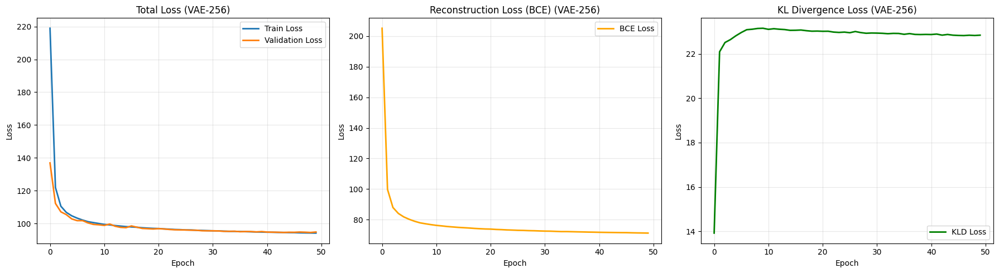

In [14]:
# Plot training and val losses for VAE-256
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Total loss
axes[0].plot(train_losses_256, label='Train Loss', linewidth=2)
axes[0].plot(val_losses_256, label='Validation Loss', linewidth=2)
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].set_title('Total Loss (VAE-256)')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# BCE loss
axes[1].plot(train_bce_losses_256, label='BCE Loss', color='orange', linewidth=2)
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Loss')
axes[1].set_title('Reconstruction Loss (BCE) (VAE-256)')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

# KLD loss
axes[2].plot(train_kld_losses_256, label='KLD Loss', color='green', linewidth=2)
axes[2].set_xlabel('Epoch')
axes[2].set_ylabel('Loss')
axes[2].set_title('KL Divergence Loss (VAE-256)')
axes[2].legend()
axes[2].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

### Reconstruction Quality - VAE-256

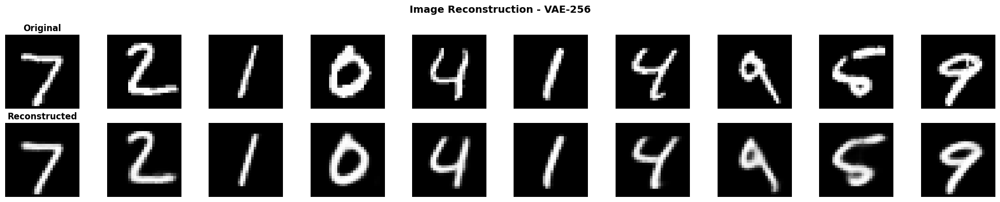

In [15]:
# Visualize reconstructions for VAE-256
vae_256.eval()

# Reconstruct images
with torch.no_grad():
    recon_images_256, mu_256, logvar_256 = vae_256(val_images.to(device))

# Move to CPU for visualization
recon_images_256 = recon_images_256.cpu()

# Plot original and reconstructed images
n_images = 10
fig, axes = plt.subplots(2, n_images, figsize=(20, 4))

for i in range(n_images):
    # Original images
    axes[0, i].imshow(val_images[i].squeeze(), cmap='gray')
    axes[0, i].axis('off')
    if i == 0:
        axes[0, i].set_title('Original', fontsize=12, fontweight='bold')
    
    # Reconstructed images
    axes[1, i].imshow(recon_images_256[i].squeeze(), cmap='gray')
    axes[1, i].axis('off')
    if i == 0:
        axes[1, i].set_title('Reconstructed', fontsize=12, fontweight='bold')

plt.suptitle('Image Reconstruction - VAE-256', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

### Generated Images - VAE-256

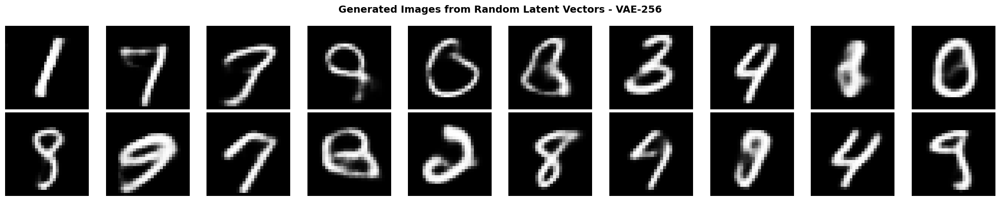

In [18]:
# Generate new images with VAE-256
vae_256.eval()

n_samples = 20
with torch.no_grad():
    # Sample random latent vectors
    z = torch.randn(n_samples, vae_256.latent_dim).to(device)
    
    # Decode to generate images
    generated_images_256 = vae_256.decode(z).cpu()

# Plot generated images
fig, axes = plt.subplots(2, 10, figsize=(20, 4))
for i in range(n_samples):
    row = i // 10
    col = i % 10
    axes[row, col].imshow(generated_images_256[i].squeeze(), cmap='gray')
    axes[row, col].axis('off')

plt.suptitle('Generated Images from Random Latent Vectors - VAE-256', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## Comparison

### Side-by-Side Reconstruction Comparison

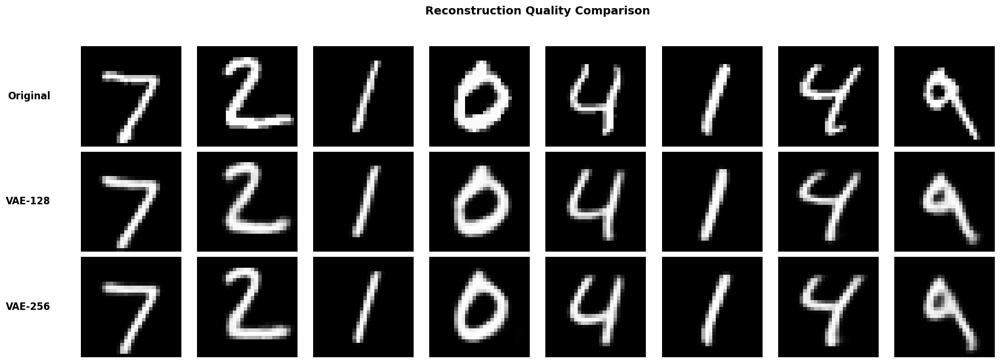

In [20]:
# Compare reconstructions side by side
n_images = 8
fig, axes = plt.subplots(3, n_images, figsize=(20, 7))

row_labels = ['Original', 'VAE-128', 'VAE-256']

for r in range(3):
    for c in range(n_images):
        if r == 0:
            axes[r, c].imshow(val_images[c].squeeze(), cmap='gray')
        elif r == 1:
            axes[r, c].imshow(recon_images[c].squeeze(), cmap='gray')
        else:
            axes[r, c].imshow(recon_images_256[c].squeeze(), cmap='gray')
        axes[r, c].axis('off')
        
        # Only add label to first column
        if c == 0:
            axes[r, c].text(-0.3, 0.5, row_labels[r], transform=axes[r, c].transAxes,
                             fontsize=12, fontweight='bold', va='center', ha='right')

plt.suptitle('Reconstruction Quality Comparison', fontsize=14, fontweight='bold')
plt.subplots_adjust(wspace=0.05, hspace=0.05, left=0.1)
plt.show()

### Side-by-Side Generated Images Comparison

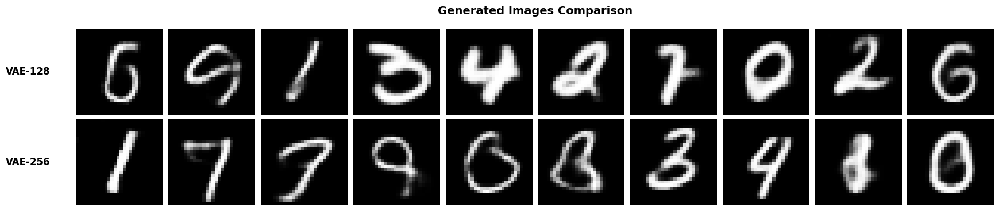

In [21]:
# Compare generated images side by side
n_images = 10
fig, axes = plt.subplots(2, n_images, figsize=(20, 4))

row_labels = ['VAE-128', 'VAE-256']

for r in range(2):
    for c in range(n_images):
        if r == 0:
            axes[r, c].imshow(generated_images[c].squeeze(), cmap='gray')
        else:
            axes[r, c].imshow(generated_images_256[c].squeeze(), cmap='gray')
        axes[r, c].axis('off')
        
        # Add label only to the first column
        if c == 0:
            axes[r, c].text(-0.3, 0.5, row_labels[r], transform=axes[r, c].transAxes,
                             fontsize=12, fontweight='bold', va='center', ha='right')

plt.suptitle('Generated Images Comparison', fontsize=14, fontweight='bold')
plt.subplots_adjust(wspace=0.05, hspace=0.05, left=0.1)
plt.show()